In [ ]:
#Import of the particular libraries 
import math
import numpy as np
import os 
import pandas as pd

from datetime import datetime, timedelta

https://archive.ics.uci.edu/ml/datasets/Heart+Disease

https://medium.com/@sid321axn/machine-learning-interpretability-for-heart-disease-prediction-23d8d95a307b

https://www.kaggle.com/johnsmith88/heart-disease-dataset/discussion/114051

In [ ]:
!pip install pandas-profiling==2.8.0

In [ ]:
!pip install -U scikit-learn

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
#Import of the visualization libraries 
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
import plotly

import plotly.offline as py #working offline
import plotly.graph_objs as go
import plotly.express as px

py.init_notebook_mode()

In [ ]:
#Setting of the visualization properties

%matplotlib inline
sns.set(style = "darkgrid")

red = "#ed0400"
grey = "#4d4d4d"

1. age(возраст в годах)
2. sex - пол (1 = мужской; 0 = женский)
3. chest pain type (4 values) - тип боли в груди:
- Значение 1: типичная стенокардия
- Значение 2: атипичная стенокардия
- Значение 3: неангинальная боль
- Значение 4: бессимптомно
4. resting blood pressure - кровяное давление в состоянии покоя(в мм рт. ст. при поступлении в больницу)
5. serum cholestoral in mg/dl - холестерол в сыворотке крови в мг/дл
6. fasting blood sugar > 120 mg/dl - уровень сахара в крови натощак > 120 мг/дл (1 = верно; 0 = неверно)
7. resting electrocardiographic results (values 0,1,2) - результаты электрокардиографии в состоянии покоя
- Значение 0: нормальное
- Значение 1: наличие аномалии ST-T (инверсия зубца T и / или элевация или депрессия ST> 0,05 мВ)
- Значение 2: указывает на вероятную или определенную гипертрофию левого желудочка по критериям Эстеса
8. maximum heart rate achieved - достигнутая
 максимальная частота сердечных сокращений
9. exercise induced angina - стенокардия, вызванная физической нагрузкой(1 = да; 0 = нет)
10. oldpeak = ST depression induced by exercise relative to rest - депрессия ST, вызванная физической нагрузкой по сравнению с отдыхом
11. the slope of the peak exercise ST segment - 
наклон сегмента ST при пиковом упражнении
- Значение 1: восходящий
- Значение 2: ровное
- Значение 3 : вниз по наклону 
12. number of major vessels (0-3) colored by flourosopy - количество крупных сосудов (0-3) , окрашенных флуороскопией
13. thal: 0 = normal; 1 = fixed defect; 2 = reversable defect

The names and social security numbers of the patients were recently removed from the database, replaced with dummy values.

Этот набор данных датируется 1988 годом и состоит из четырех баз данных: Кливленд, Венгрия, Швейцария и Лонг-Бич V. Он содержит 76 атрибутов, включая предсказанный атрибут, но все опубликованные эксперименты относятся к использованию подмножества из 14 из них. Поле «target» относится к наличию у пациента сердечного заболевания. Это целое число: 0 = нет болезни и 1 = болезнь.


Диагноз сердечного заболевания (ангиографический статус болезни)
- Значение 0: сужение диаметра <50%
- Значение 1: сужение диаметра> 50%

In [ ]:
dataset_path = "/content/heart_1.csv"

In [ ]:
dataset = pd.read_csv(dataset_path, sep = ',', header = 0)

In [ ]:
dataset.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [ ]:
dataset.shape

(303, 14)

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [ ]:
profile = ProfileReport(dataset, title='Pandas Profiling Report') 

In [ ]:
profile

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_notebook_iframe()

In [ ]:
profile.to_file(output_file="report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
explorative_profile = ProfileReport(dataset, title="Pandas Profiling Report", 
                                    explorative=True)

In [ ]:
fig = px.histogram(dataset, x = "target", color_discrete_sequence = [red, grey])

#py.iplot(fig)
plotly.offline.plot(fig, filename = 'ip_target_bar.html')

'ip_target_bar.html'

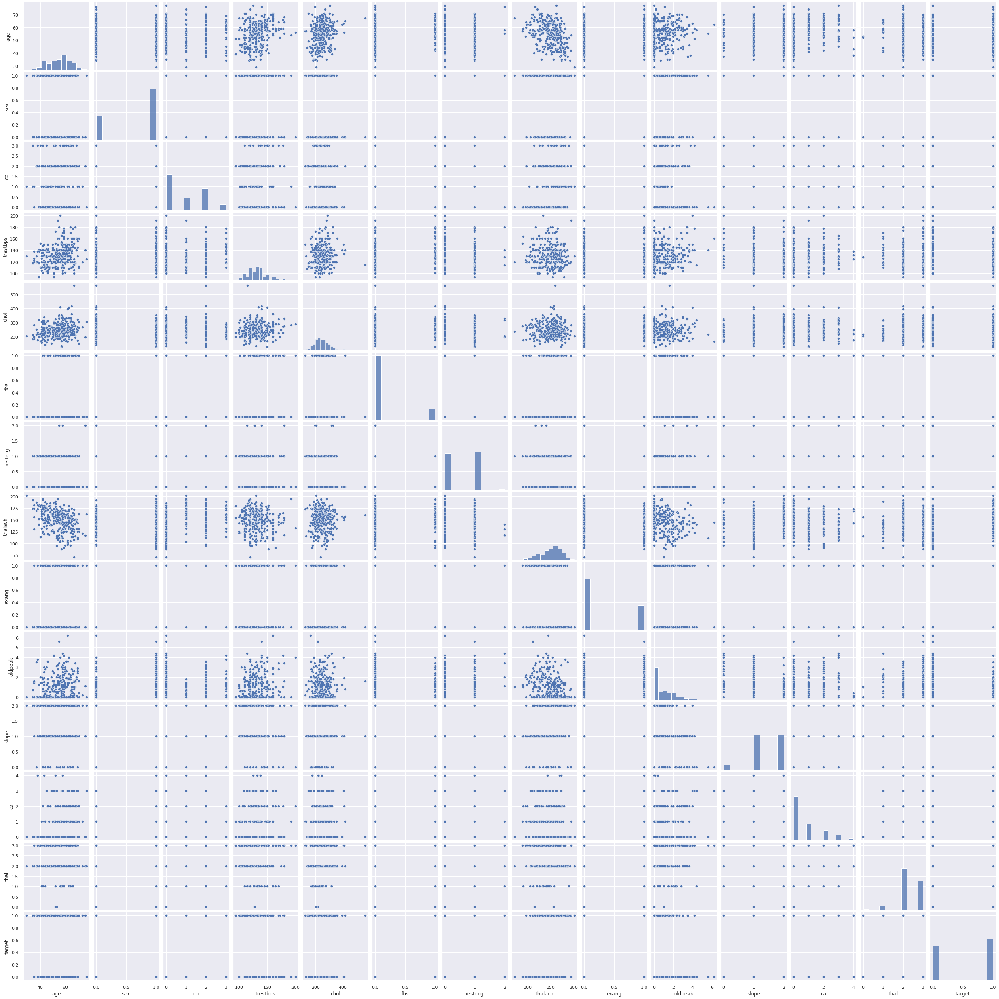

In [ ]:
sns_plot = sns.pairplot(dataset)

## Решение

### Логистическая регрессия

In [ ]:
from sklearn import model_selection

In [ ]:
X_train, X_test_1, y_train, y_test_1 = model_selection.train_test_split(dataset.iloc[:,:-1], dataset.iloc[:,-1],
                                                                        train_size = 0.6, random_state =73)

X_valid, X_test, y_valid, y_test = model_selection.train_test_split(X_test_1, y_test_1,
                                                                    train_size = 0.5, random_state = 73)

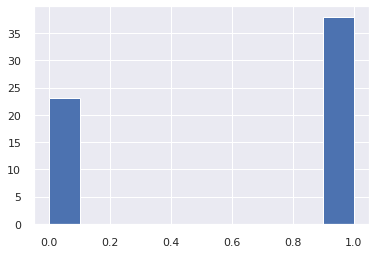

In [ ]:
y_test.hist()

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import recall_score, accuracy_score, precision_score

In [ ]:
clf_log = LogisticRegression(random_state=0)
clf_log.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression(random_state=0)

In [ ]:
y_pred  = clf_log.predict(X_valid)
print("recall = ", recall_score(y_valid, y_pred))
print("precision = ", precision_score(y_valid, y_pred))
print("accuracy = ", accuracy_score(y_valid, y_pred))

recall =  0.90625
precision =  0.8787878787878788
accuracy =  0.8852459016393442


In [ ]:
y_pred  = clf.predict(X_test)
print("recall = ", recall_score(y_test, y_pred))
print("precision = ", precision_score(y_test, y_pred))
print("accuracy = ", accuracy_score(y_test, y_pred))

recall =  0.9210526315789473
precision =  0.9210526315789473
accuracy =  0.9016393442622951


### k-means

In [ ]:
X_train_0 = X_train[y_train==0]
X_train_1 = X_train[y_train==1]

In [ ]:
X_train_0_mean = X_train_0.mean().values
X_train_1_mean = X_train_1.mean().values

In [ ]:
np.array([((X_valid - X_train_0_mean)**2).sum(axis = 1).values,
          ((X_valid - X_train_1_mean)**2).sum(axis = 1).values])

array([[   422.20159005,   3089.33275284,   4772.74391563,
          6513.42112493,   6530.51414819,   2031.9457761 ,
         26556.22833423,  10392.25368307,   5193.62763656,
          7383.66670633,   3162.35135749,    276.07228772,
          4189.40600865,   3495.86205516,   1032.46763656,
          1373.74670633,   8447.19321796,   1232.14205516,
           791.01554354,  29511.37182261, 101753.55600865,
          4428.21089237,   1957.07228772,   2235.69926447,
          3088.5829854 ,   2787.99786912,   7542.95507842,
           224.83693889,   4837.95600865,   6208.23042726,
          2568.95484586,   1428.25833423,   1492.33275284,
          2297.14205516,   3712.72345051,   4155.79042726,
          4606.24810168,  10001.32531098,   5999.79321796,
          4154.16531098,   4181.83972958,   3495.59321796,
          2022.19321796,   7137.92996214,   2591.7001947 ,
          2385.81368307,   1675.44438075,    115.93275284,
           841.62763656,   4452.87600865,    900.0955435

In [ ]:
y_pred_k_means = np.argmin(np.array([((X_valid - X_train_0_mean)**2).sum(axis = 1).values,
                                     ((X_valid - X_train_1_mean)**2).sum(axis = 1).values]), axis =0)
print("recall = ", recall_score(y_valid, y_pred_k_means))
print("precision = ", precision_score(y_valid, y_pred_k_means))
print("accuracy = ", accuracy_score(y_valid, y_pred_k_means))

recall =  0.65625
precision =  0.6774193548387096
accuracy =  0.6557377049180327


In [ ]:
y_pred = np.argmin(np.array([((X_test - X_train_0_mean)**2).sum(axis = 1).values,
                             ((X_test - X_train_1_mean)**2).sum(axis = 1).values]), axis =0)
print("recall = ", recall_score(y_test, y_pred))
print("precision = ", precision_score(y_test, y_pred))
print("accuracy = ", accuracy_score(y_test, y_pred))

recall =  0.6842105263157895
precision =  0.7878787878787878
accuracy =  0.6885245901639344


### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
neigh = KNeighborsClassifier(n_neighbors=80)
neigh.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=80)

In [ ]:
y_pred = neigh.predict(X_valid)
print("recall = ", recall_score(y_valid, y_pred))
print("precision = ", precision_score(y_valid, y_pred))
print("accuracy = ", accuracy_score(y_valid, y_pred))

recall =  0.84375
precision =  0.6428571428571429
accuracy =  0.6721311475409836


In [ ]:
y_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [ ]:
knn_recall = []
knn_precision = []
knn_accuracy = []

N = len(y_train)-1

for i in range(1,N):
  neigh = KNeighborsClassifier(n_neighbors=i)
  neigh.fit(X_train, y_train)
  y_pred = neigh.predict(X_valid)
  knn_recall.append(recall_score(y_valid, y_pred))
  knn_precision.append(precision_score(y_valid, y_pred))
  knn_accuracy.append(accuracy_score(y_valid, y_pred))


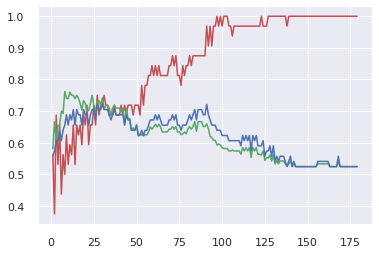

In [ ]:
plt.plot(range(1,N),knn_recall, c='r')
plt.plot(range(1,N),knn_precision, c='g')
plt.plot(range(1,N),knn_accuracy, c='b')
plt.grid
plt.show()

### Дерево решений

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier

In [ ]:
clf_tree = DecisionTreeClassifier(random_state=0, max_depth = 2)
cross_val_score(clf_tree, dataset.iloc[:,:-1], dataset.iloc[:,-1], cv=10, scoring = 'recall').mean()

0.8827205882352942

In [ ]:
clf_tree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=2, random_state=0)

In [ ]:
y_pred  = clf_tree.predict(X_valid)
print("recall = ", recall_score(y_valid, y_pred))
print("precision = ", precision_score(y_valid, y_pred))
print("accuracy = ", accuracy_score(y_valid, y_pred))

recall =  0.9375
precision =  0.6976744186046512
accuracy =  0.7540983606557377


Дерево глубины 2 даёт неплохой результат!


In [ ]:
tree_recall = []
tree_precision = []
tree_accuracy = []

N = 5

for i in range(1,N):
  clf = DecisionTreeClassifier(random_state=0, max_depth = i)
  clf.fit(X_train, y_train)
  y_pred = clf.predict(X_valid)
  tree_recall.append(recall_score(y_valid, y_pred))
  tree_precision.append(precision_score(y_valid, y_pred))
  tree_accuracy.append(accuracy_score(y_valid, y_pred))


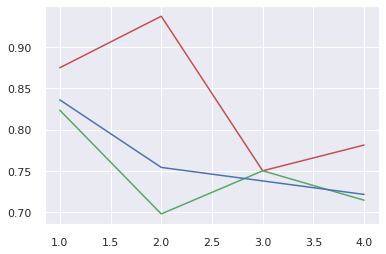

In [ ]:
plt.plot(range(1,N),tree_recall, c='r')
plt.plot(range(1,N),tree_precision, c='g')
plt.plot(range(1,N),tree_accuracy, c='b')
plt.grid
plt.show()

### Нейронная сеть

In [ ]:
import torch

In [ ]:
class HeartNet(torch.nn.Module):
    def __init__(self,n_input, n_hidden_neurons):
        super(HeartNet, self).__init__()
        self.fc1 = torch.nn.Linear(n_input, n_hidden_neurons)
        # your code here
        self.activ1 = torch.nn.functional.relu
        self.fc2 = torch.nn.Linear(n_hidden_neurons, n_hidden_neurons)
        self.activ2 = torch.tanh
        self.fc3 = torch.nn.Linear(n_hidden_neurons, 1)
        self.sm = torch.nn.Sigmoid()
        
    def forward(self, x):
        x = self.fc1(x)
        x = self.activ1(x)
        x = self.fc2(x)
        x = self.activ2(x)
        x = self.fc3(x)
        x = self.sm(x)
        return x

    def inference(self, x):
        x = self.forward(x)
        x = self.sm(x)
        return x
    
n_input =  13 # choose number of input neurons
n_hidden = 10           # choose number of hidden neurons
heart_net = HeartNet(n_input, n_hidden)

In [ ]:
loss = torch.nn.functional.binary_cross_entropy
optimizer = torch.optim.Adam(heart_net.parameters(), lr=1.0e-3)

In [ ]:
import time

In [ ]:
y_train

52     1
53     1
122    1
290    0
171    0
      ..
180    0
181    0
166    0
272    0
146    1
Name: target, Length: 181, dtype: int64

In [ ]:
X_train, X_test_1, y_train, y_test_1 = model_selection.train_test_split(dataset.iloc[:,:-1], dataset.iloc[:,-1],
                                                                        train_size = 0.6, random_state =73)

X_valid, X_test, y_valid, y_test = model_selection.train_test_split(X_test_1, y_test_1,
                                                                    train_size = 0.5, random_state = 73)

In [ ]:
X_train = torch.FloatTensor(X_train.values)
X_valid = torch.FloatTensor(X_valid.values)
X_test = torch.FloatTensor(X_test.values)
y_train = torch.FloatTensor(y_train.values)
y_valid = torch.FloatTensor(y_valid.values)
y_test = torch.FloatTensor(y_test.values)

In [ ]:
batch_size =  1   # choose different batch sizes
time_batch = []
for epoch in range(2000):
    order = np.random.permutation(len(X_train))
    start_time = time.time()
    optimizer.zero_grad()
    
    
    preds = heart_net.forward(X_train) 
    # print(preds)
    # print(y_train)
    loss_value = loss(preds[:,0], y_train)
    loss_value.backward()
    
    optimizer.step()
        
    if epoch % 10 == 0:
        test_preds = heart_net.forward(X_valid)
        test_preds = test_preds.argmax(dim=1)
        t = (time.time() - start_time)
        print((test_preds == y_valid).float().mean(), "--- %s seconds ---" , t)
        time_batch.append(t)

print(np.mean(time_batch))

tensor(0.4754) --- %s seconds --- 0.004645347595214844
tensor(0.4754) --- %s seconds --- 0.0009207725524902344
tensor(0.4754) --- %s seconds --- 0.0009100437164306641
tensor(0.4754) --- %s seconds --- 0.0009043216705322266
tensor(0.4754) --- %s seconds --- 0.0009119510650634766
tensor(0.4754) --- %s seconds --- 0.0009305477142333984
tensor(0.4754) --- %s seconds --- 0.0009088516235351562
tensor(0.4754) --- %s seconds --- 0.0009050369262695312
tensor(0.4754) --- %s seconds --- 0.0009288787841796875
tensor(0.4754) --- %s seconds --- 0.0009262561798095703
tensor(0.4754) --- %s seconds --- 0.0009722709655761719
tensor(0.4754) --- %s seconds --- 0.0020737648010253906
tensor(0.4754) --- %s seconds --- 0.0009233951568603516
tensor(0.4754) --- %s seconds --- 0.0009303092956542969
tensor(0.4754) --- %s seconds --- 0.0009028911590576172
tensor(0.4754) --- %s seconds --- 0.0008995532989501953
tensor(0.4754) --- %s seconds --- 0.0010104179382324219
tensor(0.4754) --- %s seconds --- 0.0009558200836

In [ ]:
preds = heart_net.forward(X_valid)
print(preds)
recall_score(y_valid,list(map(lambda x: 1 if (x>0.5) else 0,preds)))

tensor([[0.0370],
        [0.0325],
        [0.0325],
        [0.9270],
        [0.9870],
        [0.9878],
        [0.0325],
        [0.3743],
        [0.5368],
        [0.9877],
        [0.9868],
        [0.0406],
        [0.9876],
        [0.0768],
        [0.4437],
        [0.8009],
        [0.0325],
        [0.9866],
        [0.0325],
        [0.8171],
        [0.8171],
        [0.9855],
        [0.8065],
        [0.5394],
        [0.0325],
        [0.0325],
        [0.0326],
        [0.0325],
        [0.9806],
        [0.0325],
        [0.3823],
        [0.4042],
        [0.7298],
        [0.4486],
        [0.9879],
        [0.7575],
        [0.8171],
        [0.2752],
        [0.9878],
        [0.9541],
        [0.3983],
        [0.0325],
        [0.3805],
        [0.0325],
        [0.8141],
        [0.0325],
        [0.9863],
        [0.4026],
        [0.0325],
        [0.0500],
        [0.9879],
        [0.9839],
        [0.8239],
        [0.0852],
        [0.5442],
        [0

0.71875

In [ ]:
preds = heart_net.forward(X_test)
recall_score(y_test,list(map(lambda x: 1 if (x>0.5) else 0,preds)))

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1794: UserWarning:

nn.functional.tanh is deprecated. Use torch.tanh instead.



0.8947368421052632

### Ансамбль

In [ ]:
X_train, X_test_1, y_train, y_test_1 = model_selection.train_test_split(dataset.iloc[:,:-1], dataset.iloc[:,-1],
                                                                        train_size = 0.6, random_state =73)

X_valid, X_test, y_valid, y_test = model_selection.train_test_split(X_test_1, y_test_1,
                                                                    train_size = 0.5, random_state = 73)

In [ ]:
def ems(X):
  return((clf_log.predict(X) + \
         np.argmin(np.array([((X- X_train_0_mean)**2).sum(axis = 1).values,
                             ((X - X_train_1_mean)**2).sum(axis = 1).values]), axis =0) + \
         neigh.predict(X) +\
         clf_tree.predict(X) +\
         list(map(lambda x: 1 if (x>0.5) else 0,
         torch.reshape(heart_net.forward(torch.FloatTensor(X.values)),(1,len(X)))
         .detach().numpy()[0])))>=3)


In [ ]:
y_pred_ems = list(map(lambda x: 1 if (x==True) else 0, ems(X_valid)))
print("recall = ", recall_score(y_valid, y_pred_ems))
print("precision = ", precision_score(y_valid, y_pred_ems))
print("accuracy = ", accuracy_score(y_valid, y_pred_ems))

recall =  0.90625
precision =  0.7837837837837838
accuracy =  0.819672131147541


### Случайный лес

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
X_train, X_test_1, y_train, y_test_1 = model_selection.train_test_split(dataset.iloc[:,:-1], dataset.iloc[:,-1],
                                                                        train_size = 0.6, random_state =73)

X_valid, X_test, y_valid, y_test = model_selection.train_test_split(X_test_1, y_test_1,
                                                                    train_size = 0.5, random_state = 73)

In [ ]:
clf_forest = RandomForestClassifier(max_depth=2, random_state=0)
clf_forest.fit(X_train, y_train)

RandomForestClassifier(max_depth=2, random_state=0)

In [ ]:
y_pred_forest = clf_forest.predict(X_valid)
print("recall = ", recall_score(y_valid, y_pred_forest))
print("precision = ", precision_score(y_valid, y_pred_forest))
print("accuracy = ", accuracy_score(y_valid, y_pred_forest))

recall =  0.90625
precision =  0.8529411764705882
accuracy =  0.8688524590163934


In [ ]:
y_pred_forest = clf_forest.predict(X_test)
print("recall = ", recall_score(y_test, y_pred_forest))
print("precision = ", precision_score(y_test, y_pred_forest))
print("accuracy = ", accuracy_score(y_test, y_pred_forest))

recall =  0.9210526315789473
precision =  0.9210526315789473
accuracy =  0.9016393442622951
